## Tomato Pollination Final

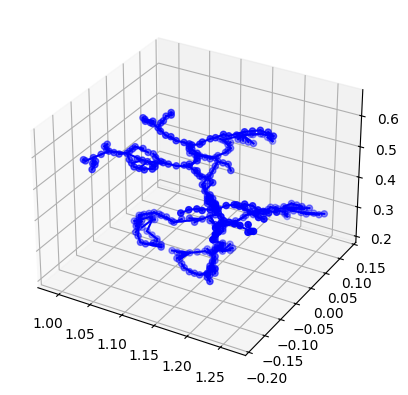

In [1]:
import numpy as np
import time
import dismech

geom = dismech.GeomParams(
    rod_r0=2e-2,
    shell_h=0.0,
)

material = dismech.Material(density=1500,
                            youngs_rod=3.16e7,
                            youngs_shell=0,
                            poisson_rod=0.5,
                            poisson_shell=0)

dyn_sim = dismech.SimParams(static_sim=False,
                                  two_d_sim=True,   # no twisting
                                  use_mid_edge=False,
                                  use_line_search=False,
                                  show_floor=False,
                                  log_data=True,
                                  log_step=1,
                                  dt=1e-2,
                                  max_iter=50,
                                  total_time=1,
                                  plot_step=1,
                                  tol=1e-4,
                                  ftol=1e-4,
                                  dtol=1e-2
                                  )

env = dismech.Environment()
env.add_force('gravity', g=np.array([0.0, 0.0, -9.81]))
env.add_force('damping', eta=100)

geo = dismech.Geometry.from_txt(
    '../tests/resources/tomato_pollination/cleaned_plant4.txt')

robot = dismech.SoftRobot(geom, material, geo, dyn_sim, env)

### Move the stem: Moving BC

1. Move the base

In [2]:
# # --- pick the main grip node robustly ---
# grasping_point = np.array([1.162693, -0.026231, 0.275337])
# xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

# main_grip = np.where((xyz == grasping_point).all(axis=1))[0]

# print("Main grip node:", main_grip)

# other_grip_nodes_below = np.array([32, 48, 42, 45, 45, 54, 52, 51], dtype=int)
# other_grip_nodes_above = np.array([73, 65, 60], dtype=int)

2. Move the middle

In [3]:
# --- pick the main grip node robustly ---
grasping_point = np.array([1.154693, -0.034231, 0.395337])
xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

main_grip = np.where((xyz == grasping_point).all(axis=1))[0]

print("Main grip node:", main_grip)

other_grip_nodes_below = np.array([130, 134, 135, 136], dtype=int)
other_grip_nodes_above = np.array([142, 141, 140, 139, 138], dtype=int)

Main grip node: [137]


3. Move the top

In [4]:
# # --- pick the main grip node robustly ---
# grasping_point = np.array([1.122693, -0.042231, 0.571337])
# xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

# main_grip = np.where((xyz == grasping_point).all(axis=1))[0]

# print("Main grip node:", main_grip)

# other_grip_nodes_below = np.array([278, 279, 280], dtype=int)
# other_grip_nodes_above = np.array([285, 284, 283, 282], dtype=int)

In [5]:
# # Keep an explicit order: main first, then others
grip_nodes = np.r_[main_grip, other_grip_nodes_below].astype(int)


base_nodes = np.where((robot.state.q[robot.node_dof_indices].reshape(-1, 3)[:, 2]) < 0.234)[0] # fixed base

# Fix: main_grip node + base nodes
robot = robot.fix_nodes(np.unique(np.r_[main_grip, base_nodes]))

# --- define the distributed shaking on grip nodes only ---
def shake_distributed(robot: dismech.SoftRobot, t: float):
    """Moving boundary condition on grip_nodes with linearly scaled amplitudes."""
    amplitude = 0.001  # meters at main grip node
    #### amplitude = 0.004  # converges for "move the middle" case
    frequency = 5.0    # Hz

    xyz = robot.state.q[robot.node_dof_indices].reshape(-1, 3)

    # Reference length: distance main <-> first stationary node in your list
    # If you meant a specific stationary anchor, pick it explicitly; here we use the
    # first of your "other" nodes that exists.

    L_ref = np.linalg.norm(xyz[main_grip] - xyz[grip_nodes[1]])

    # Build amplitudes aligned to grip_nodes order
    all_grip_nodes = np.r_[grip_nodes, other_grip_nodes_above]
    amps = np.empty(all_grip_nodes.size, dtype=float)
    amps[0] = amplitude  # main node
    for i in range(1, grip_nodes.size):
        dist = np.linalg.norm(xyz[grip_nodes[1]] - xyz[grip_nodes[i]])
        amps[i] = amplitude * (dist / L_ref)

    # Also move the "above" nodes
    L_ref_above = np.linalg.norm(xyz[main_grip] - xyz[other_grip_nodes_above[0]])
    for node in other_grip_nodes_above:
        dist = np.linalg.norm(xyz[other_grip_nodes_above[0]] - xyz[node])
        amps[i+1] = amplitude * (dist / L_ref_above)
        i = i + 1

    # print("Amplitudes:", amps)
    # print("Grip nodes:", all_grip_nodes)
    
    # Sinusoidal displacement along +X
    disp_x = amps * np.sin(2 * np.pi * frequency * t)
    disp = np.column_stack([disp_x, np.zeros_like(disp_x), np.zeros_like(disp_x)])  # (N,3)

    # Move ONLY the grip nodes (root nodes are already fixed)
    robot = robot.move_nodes(all_grip_nodes, disp.reshape(-1,1).flatten())
    return robot

stepper = dismech.ImplicitEulerTimeStepper(robot)
stepper.before_step = shake_distributed

In [6]:
print("grasping points:", grip_nodes)

grasping points: [137 130 134 135 136]


### Simulate

In [7]:
# simulate
robots = stepper.simulate()

qs = np.stack([robot.state.q for robot in robots])

iter: 1, error: 1734.049
iter: 2, error: 4823.477
current_time:  0.01
iter: 1, error: 3300.062
iter: 2, error: 11496.415
current_time:  0.02
iter: 1, error: 4535.716
iter: 2, error: 14113.582
current_time:  0.03
iter: 1, error: 5316.823
iter: 2, error: 2305.977
current_time:  0.04
iter: 1, error: 5568.279
iter: 2, error: 2193.592
current_time:  0.05
iter: 1, error: 5274.354
iter: 2, error: 2764.757
current_time:  0.06
iter: 1, error: 4468.843
iter: 2, error: 1927.901
current_time:  0.07
iter: 1, error: 3235.291
iter: 2, error: 704.561
current_time:  0.08
iter: 1, error: 1696.163
iter: 2, error: 147.991
current_time:  0.09
iter: 1, error: 0.734
current_time:  0.1
iter: 1, error: 1692.765
iter: 2, error: 168.699
current_time:  0.11
iter: 1, error: 3223.082
iter: 2, error: 574.453
current_time:  0.12
iter: 1, error: 4447.158
iter: 2, error: 1060.902
current_time:  0.13
iter: 1, error: 5246.821
iter: 2, error: 1440.333
current_time:  0.14
iter: 1, error: 5540.777
iter: 2, error: 1569.657
c

### Plotting

In [8]:
t = np.arange(robot.sim_params.total_time, step=robot.sim_params.dt)
options = dismech.AnimationOptions(title='Tomato plant')

fig = dismech.get_interactive_animation_plotly(robot, t, qs , options)
fig.show()

100


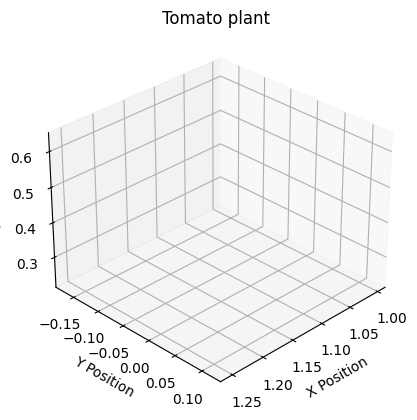

In [9]:
ani = dismech.get_animation(robot, t, qs, options)
ani.save('tomato.gif')

### Estimated values of parameters

In [10]:
L = 0.292 # m
r0 = 0.0059 # m

delta = 0.054 # m # delta = PL^3/(3EI)
P = 0.02*9.81 # N

K = P/delta # effective stiffness

I = np.pi * r0**4 / 4
E = P*(L**3) / (3 * I * delta)

print("E:", E)

f = 1.38 # Hz
TP = 0.725 # s

omega = 2 * np.pi * f
m_eff = K / omega**2
print("m_eff:", m_eff)

# estimate density
V = np.pi * r0**2 * L
rho = m_eff / V
print("rho:", rho)

E: 31683606.79586816
m_eff: 0.048326721526529885
rho: 1513.389046285066
